In [1]:
%matplotlib inline

import os
import numpy as np
import torch
import torchvision as torchv
from PIL import Image
from torchvision import models, transforms
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
import torch.nn as nn
from mtcnn import MTCNN
from imutils.face_utils import FaceAligner
from imutils.face_utils import rect_to_bb
import argparse
import imutils
import dlib
import cv2

plt.rcParams.update({'figure.max_open_warning': 0})

### --------------------- ###

import numpy as np 
import faiss

In [2]:
model = models.alexnet(pretrained=True)
model.classifier = nn.Sequential(*[model.classifier[i] for i in range(5)])
vector_length = 4096

#model = models.resnet101(pretrained=True)
#vector_length = 1000

In [3]:
use_cuda = torch.cuda.is_available()

preprocess  = transforms.Compose([transforms.Resize(224),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()
                                ])

if use_cuda:
    model = model.cuda()

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')
fa = FaceAligner(predictor, desiredFaceWidth=224)

def allignImag(image):
    return image
    
    # load the input image, resize it, and convert it to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    rects = detector(gray, 2)
    rect = rects[0]

    (x, y, w, h) = rect_to_bb(rect)
    #faceOrig = imutils.resize(image[y:y + h, x:x + w], width=224)
    faceAligned = fa.align(image, gray, rect)
    
    return faceAligned

def cropFace(img):
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    faces = detector.detect_faces(img)
    # display faces on the original image

    confidence_cutoff = 0.9
    if faces[0]['confidence'] >= confidence_cutoff:
        # get coordinates
        x1, y1, width, height = faces[0]['box']
        x2, y2 = x1 + width, y1 + height

    image = Image.fromarray(img[y1:y2, x1:x2])
    return image

def addToArchive(dir):
    filename = dir
    # load image from file
    image = plt.imread(filename)
    if len(image.shape) != 3:
        print (dir)
        return

    image = cropFace(allignImag(image))

    model.eval()
    vec1 = model(preprocess(image).view(1,3,224,224)).detach().numpy()
    archive.append(list(vec1.reshape(vector_length)))
    
def addToArchive2(dir):
    filename = dir
    # load image from file
    image = plt.imread(filename)
    if len(image.shape) != 3:
        print (dir)
        return

    image = cropFace(allignImag(image))

    model.eval()
    vec1 = model(preprocess(image).view(1,3,224,224)).detach().numpy()
    archive2.append(list(vec1.reshape(vector_length)))
    
def get_immediate_subdirectories(a_dir):
    return [name for name in os.listdir(a_dir) 
           if '.JPG' in name]    

def recognize(arc_subdir, testDir, indices, blind=False):

    filename = dir
    return_ = 0
    indices_ = np.delete(indices, np.where(indices == -1))
    
    img_dir1 = testDir.split('/')[-1][:-4]
    id1 = int(img_dir1[:3])

    if not blind:
        fig = plt.figure(figsize=(8, 8))
        fig.add_subplot(1, 1 + indices_.shape[0], 1)
        # showing image
        image_test = Image.open(testDir)
        plt.imshow(image_test)
        plt.axis('off')
        try:    
            msg = 'id' + str(int(img_dir1[:3])) + ', ' + str(int(img_dir1[-2:])) + ' yo'
            plt.title(msg)
        except:
            msg = 'id' + str(int(img_dir1[:3])) + ', ' + str(int(img_dir1[-3:-1])) + ' yo'
            plt.title(msg)


    for i, ind in enumerate(indices_, 2):
        
        img_dir2 = data[ind][:-4]
        id2 = int(img_dir2[:3])
        
        if not blind:
            fig.add_subplot(1, 1 + indices_.shape[0], i)
            # showing image
            image_arc = Image.open(arc_subdir + data[ind])
            plt.imshow(image_arc)
            plt.axis('off')
            msg = ''
            try:    
                msg = 'id' + str(int(img_dir2[:3])) + ', ' + str(int(img_dir2[-2:])) + ' yo'
            except:
                msg = 'id' + str(int(img_dir2[:3])) + ', ' + str(int(img_dir2[-3:-1])) + ' yo'
                
            if id1 == id2 :
                plt.title(msg, color='green')
            else:
                plt.title(msg, color='red')
                
        if id1 == id2 :
            return_ = 1

    return return_


In [4]:
archiveDir = 'archive'
testDir = 'test'

In [4]:
data = get_immediate_subdirectories(archiveDir)
archive = []

for i, dir in enumerate(data):
    #train_y[i] = int(str(dir)[:3])
    addToArchive(archiveDir + '/' + dir)
    print('Adding to archive: ' + str(i+1) + '/' + str(len(data)), end="\r")
    
db_vectors = np.array(archive)

In [21]:
dimension = vector_length    # dimensions of each vector     
n = len(data)    # number of vectors   

nlist = 2  # number of clusters
quantiser = faiss.IndexFlatL2(dimension)  
index = faiss.IndexIVFFlat(quantiser, dimension, nlist, faiss.METRIC_L2)

In [22]:
index.train(db_vectors)  # train on the database vectors
index.add(db_vectors)   # add the vectors and update the index

In [6]:
#faiss.write_index(index,"archive_alexnet.index")  # save the index to disk
#index = faiss.read_index("archive_alexnet.index")  # load the index

In [7]:
data2 = get_immediate_subdirectories(testDir)
archive2 = []

for i, dir in enumerate(data2):
    addToArchive2(testDir + '/' + dir)
    print('Adding to archive2: ' + str(i+1) + '/' + str(len(data2)), end="\r")

In [8]:
nprobe = 5  # find 5 most similar clusters
n_query = len(data2)
k = 5  # return 5 nearest neighbours

query_vectors = np.array(archive2)
distances, indices = index.search(query_vectors, k)

#print(indices)

Recognizing: 148/148
Accuracy: 40/148, (27.03%)


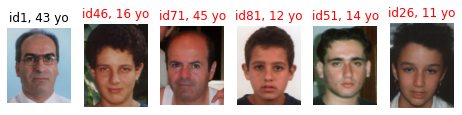

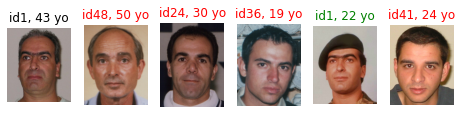

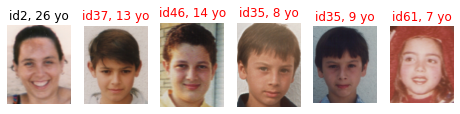

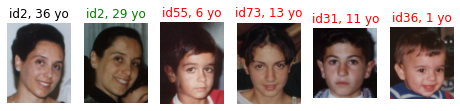

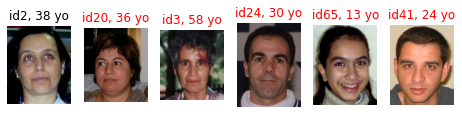

...

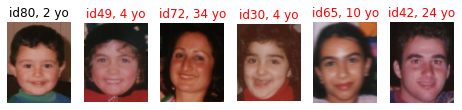

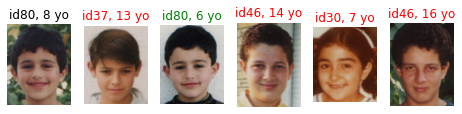

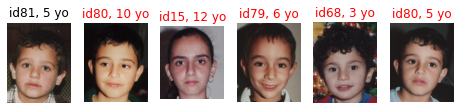

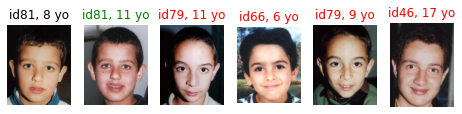

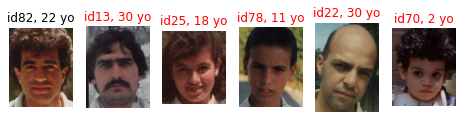

In [10]:
data = get_immediate_subdirectories(archiveDir)
test_data = get_immediate_subdirectories(testDir)

test_acc = 0
for i, dir in enumerate(test_data, 1):
    print('Recognizing: ' + str(i) + '/' + str(len(test_data)) , end="\r")
    test_acc = test_acc + recognize(archiveDir + '/', testDir + '/' + dir, indices[i-1])
    
print('\nAccuracy: ' + str(test_acc) + '/' + str(len(test_data)) + ', (' + "{:.2f}".format(test_acc*100/len(test_data)) + '%)')